In [1]:
import pandas as pd
import numpy as np

import time
import cv2
from tqdm import tqdm_notebook, tqdm
from keras.preprocessing.image import save_img
from keras.applications import vgg16
from keras import backend as K

Using TensorFlow backend.


In [2]:
# dimensions of the generated pictures for each filter.
img_width = 128
img_height = 128

In [3]:
# the name of the layer we want to visualize
# (see model definition at keras/applications/vgg16.py)
layer_name = 'block5_conv1'

In [4]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + K.epsilon())
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    if K.image_data_format() == 'channels_first':
        x = x.transpose((1, 2, 0))
    x = np.clip(x, 0, 255).astype('uint8')
    return x


In [5]:
# build the VGG16 network with ImageNet weights
model = vgg16.VGG16(weights='imagenet', include_top=False)
print('Model loaded.')

model.summary()

Model loaded.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0      

In [6]:
# the name of the layer we want to visualize
# (see model definition at keras/applications/vgg16.py)
layer_name = 'block5_conv1'

In [7]:
# this is the placeholder for the input images
input_img = model.input

In [8]:
input_img.shape

TensorShape([Dimension(None), Dimension(None), Dimension(None), Dimension(3)])

In [9]:
input_img_data = cv2.imread('../cache/Cat03.jpg')
input_img_data = cv2.resize(input_img_data, (img_height,img_width))
input_img_data_gray = cv2.cvtColor(input_img_data, cv2.COLOR_BGR2GRAY)
#bgr -> rgb
input_img_data = cv2.cvtColor(input_img_data, cv2.COLOR_BGR2RGB)

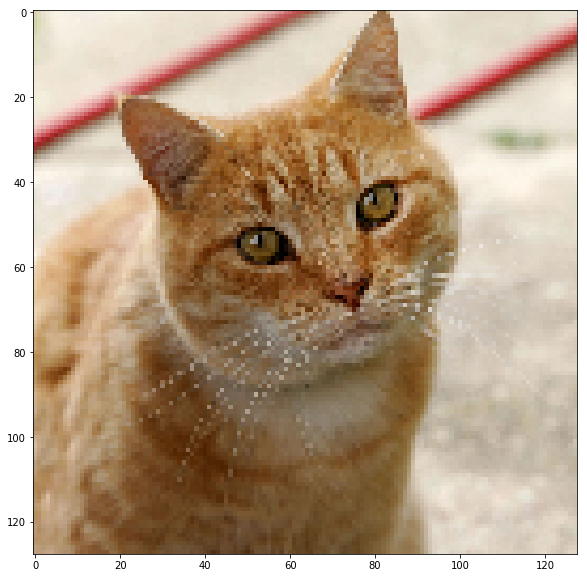

In [10]:
%matplotlib inline

import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
plt.imshow(input_img_data)

In [11]:
input_img_data = np.dstack([input_img_data_gray,input_img_data_gray,input_img_data_gray])

In [12]:
input_img_data.shape

(128, 128, 3)

In [13]:
input_img_data = input_img_data.reshape(1,128,128,3)

In [14]:
input_img_data.shape

(1, 128, 128, 3)

In [15]:
# get the symbolic outputs of each "key" layer (we gave them unique names).
layer_dict = dict([(layer.name, layer) for layer in model.layers[1:]])

In [16]:
layer_dict

{'block1_conv1': <keras.layers.convolutional.Conv2D at 0x7fd51f4154e0>,
 'block1_conv2': <keras.layers.convolutional.Conv2D at 0x7fd51f415390>,
 'block1_pool': <keras.layers.pooling.MaxPooling2D at 0x7fd51f415c50>,
 'block2_conv1': <keras.layers.convolutional.Conv2D at 0x7fd51f42ec88>,
 'block2_conv2': <keras.layers.convolutional.Conv2D at 0x7fd51e9e1780>,
 'block2_pool': <keras.layers.pooling.MaxPooling2D at 0x7fd51e9f4898>,
 'block3_conv1': <keras.layers.convolutional.Conv2D at 0x7fd51e9854e0>,
 'block3_conv2': <keras.layers.convolutional.Conv2D at 0x7fd51e9f79e8>,
 'block3_conv3': <keras.layers.convolutional.Conv2D at 0x7fd51e9acf60>,
 'block3_pool': <keras.layers.pooling.MaxPooling2D at 0x7fd51e956978>,
 'block4_conv1': <keras.layers.convolutional.Conv2D at 0x7fd51e964978>,
 'block4_conv2': <keras.layers.convolutional.Conv2D at 0x7fd51e972cf8>,
 'block4_conv3': <keras.layers.convolutional.Conv2D at 0x7fd51e90cdd8>,
 'block4_pool': <keras.layers.pooling.MaxPooling2D at 0x7fd51e92db0

In [17]:
def normalize(x):
    # utility function to normalize a tensor by its L2 norm
    return x / (K.sqrt(K.mean(K.square(x))) + K.epsilon())


In [18]:
# input_img = K.variable(input_img)
# input_img.shape

In [19]:
model.layers[1].output.shape

TensorShape([Dimension(None), Dimension(None), Dimension(None), Dimension(64)])

In [29]:
kept_filters = []
for filter_index in tqdm(range(512)):
    # we only scan through the first 200 filters,
    # but there are actually 512 of them
#     print('Processing filter %d' % filter_index)
    start_time = time.time()

    # we build a loss function that maximizes the activation
    # of the nth filter of the layer considered
    layer_output = layer_dict[layer_name].output
    if K.image_data_format() == 'channels_first':
        loss = K.mean(layer_output[:, filter_index, :, :])
    else:
        loss = K.mean(layer_output[:, :, :, filter_index])

    # we compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, input_img)[0]

    # normalization trick: we normalize the gradient
    grads = normalize(grads)

    # this function returns the loss and grads given the input picture
    iterate = K.function([input_img], [loss, grads])

    # step size for gradient ascent
    step = 1.

    # we start from a gray image with some random noise
#     if K.image_data_format() == 'channels_first':
#         input_img_data = np.random.random((1, 3, img_width, img_height))
#     else:
#         input_img_data = np.random.random((1, img_width, img_height, 3))
    
    input_img_data = (input_img_data - 0.5) * 20 + 128

    # we run gradient ascent for 20 steps
    for i in range(20):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step

#         print('Current loss value:', loss_value)
        if loss_value <= 0.:
            # some filters get stuck to 0, we can skip them
            break

    # decode the resulting input image
    if loss_value > 0:
        img = deprocess_image(input_img_data[0])
        kept_filters.append((img, loss_value))
    end_time = time.time()
#     print('Filter %d processed in %ds' % (filter_index, end_time - start_time))


100%|██████████| 512/512 [11:47<00:00,  2.69s/it]


In [30]:
len(kept_filters)

436

In [31]:
# we will stich the best 64 filters on a 8 x 8 grid.
n = 8

# the filters that have the highest loss are assumed to be better-looking.
# we will only keep the top 64 filters.
kept_filters.sort(key=lambda x: x[1], reverse=True)
kept_filters = kept_filters[:n * n]

# build a black picture with enough space for
# our 8 x 8 filters of size 128 x 128, with a 5px margin in between
margin = 5
width = n * img_width + (n - 1) * margin
height = n * img_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

In [32]:
stitched_filters.shape

(1059, 1059, 3)

In [33]:
# fill the picture with our saved filters
for i in range(n):
    for j in range(n):
#         print(i*n+j)
        img, loss = kept_filters[i * n + j]
        width_margin = (img_width + margin) * i
        height_margin = (img_height + margin) * j
        stitched_filters[
            width_margin: width_margin + img_width,
            height_margin: height_margin + img_height, :] = img

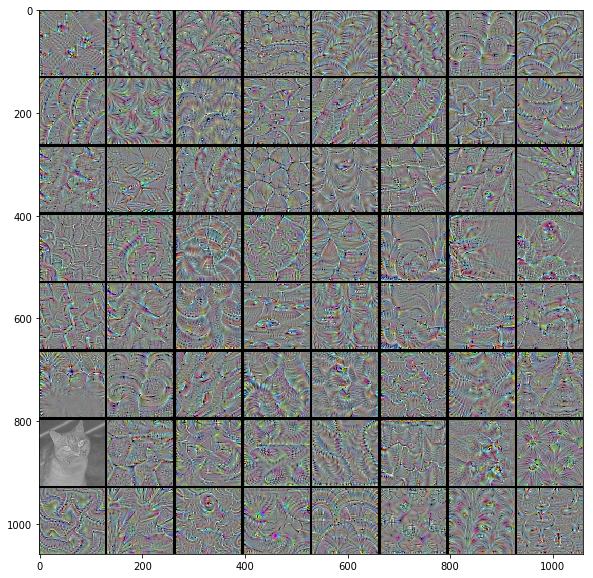

In [34]:
%matplotlib inline

import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
plt.imshow(stitched_filters)

In [22]:
import os
for layer in model.layers[1:]:
    layer_name = layer.name
    fname = layer_name+'.npy'
    if os.path.isfile(fname):
        print(layer_name)
        continue
    kept_filters = []
    for filter_index in tqdm_notebook(range(layer.output.shape[-1])):
        # we only scan through the first 200 filters,
        # but there are actually 512 of them
    #     print('Processing filter %d' % filter_index)
        start_time = time.time()

        # we build a loss function that maximizes the activation
        # of the nth filter of the layer considered
        layer_output = layer_dict[layer_name].output
        if K.image_data_format() == 'channels_first':
            loss = K.mean(layer_output[:, filter_index, :, :])
        else:
            loss = K.mean(layer_output[:, :, :, filter_index])

        # we compute the gradient of the input picture wrt this loss
        grads = K.gradients(loss, input_img)[0]

        # normalization trick: we normalize the gradient
        grads = normalize(grads)

        # this function returns the loss and grads given the input picture
        iterate = K.function([input_img], [loss, grads])

        # step size for gradient ascent
        step = 1.

        # we start from a gray image with some random noise
    #     if K.image_data_format() == 'channels_first':
    #         input_img_data = np.random.random((1, 3, img_width, img_height))
    #     else:
    #         input_img_data = np.random.random((1, img_width, img_height, 3))

        input_img_data = (input_img_data - 0.5) * 20 + 128

        # we run gradient ascent for 20 steps
        for i in range(20):
            loss_value, grads_value = iterate([input_img_data])
            input_img_data += grads_value * step

    #         print('Current loss value:', loss_value)
            if loss_value <= 0.:
                # some filters get stuck to 0, we can skip them
                break

        # decode the resulting input image
        if loss_value > 0:
            img = deprocess_image(input_img_data[0])
            kept_filters.append((img, loss_value))
        end_time = time.time()
    #     print('Filter %d processed in %ds' % (filter_index, end_time - start_time))
        name = '../cache/' + layer_name
        np.save(layer_name, kept_filters)

block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1


HBox(children=(IntProgress(value=0, max=512), HTML(value='')))

HBox(children=(IntProgress(value=0, max=512), HTML(value='')))

HBox(children=(IntProgress(value=0, max=512), HTML(value='')))

block1_conv1
28 5
block1_conv2
64 8
block1_pool
64 8
block2_conv1
118 10
block2_conv2
128 11
block2_pool
128 11
block3_conv1
251 15
block3_conv2
250 15
block3_conv3
248 15
block3_pool
251 15
block4_conv1
501 22
block4_conv2
483 21
block4_conv3
404 20
block4_pool
413 20
block5_conv1
37 6
block5_conv2
417 20
block5_conv3
183 13
block5_pool
187 13


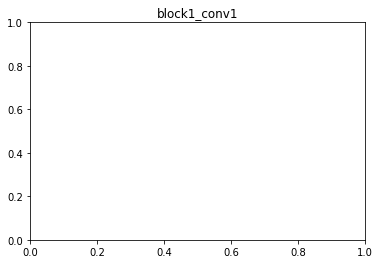

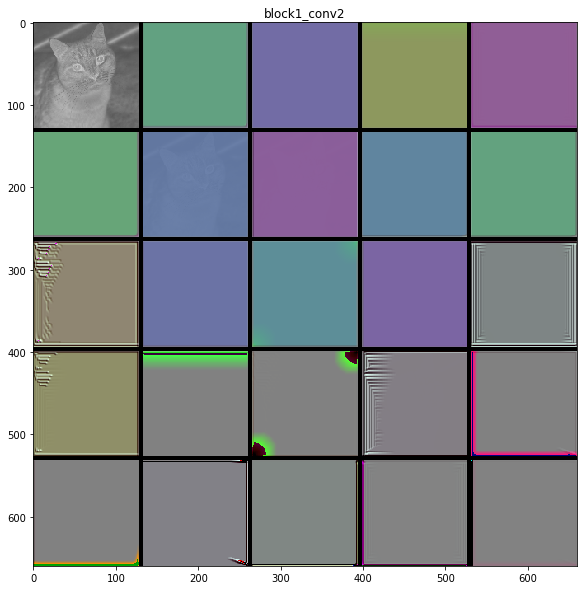

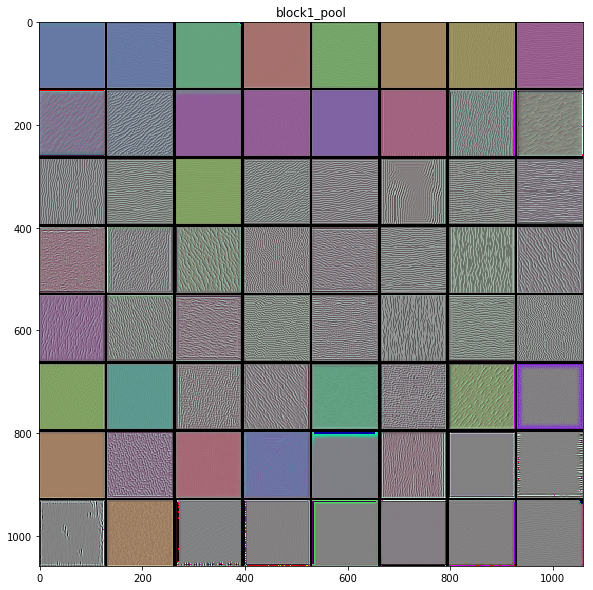

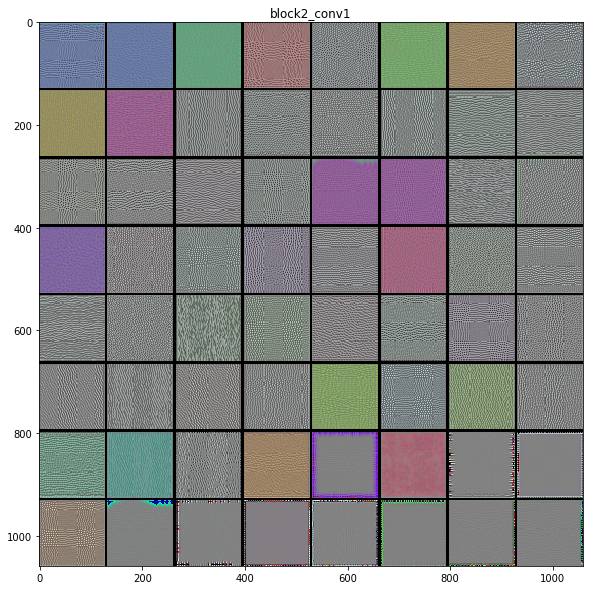

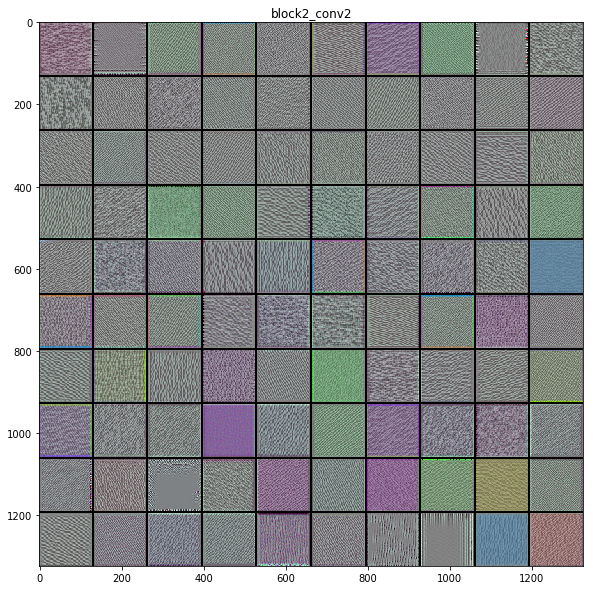

...

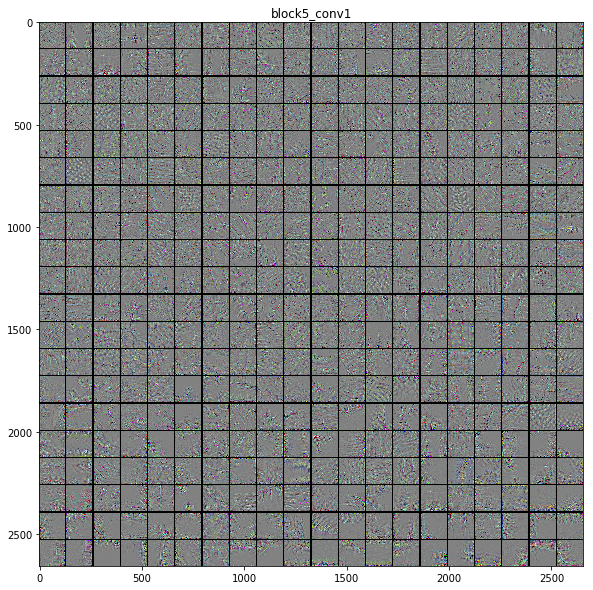

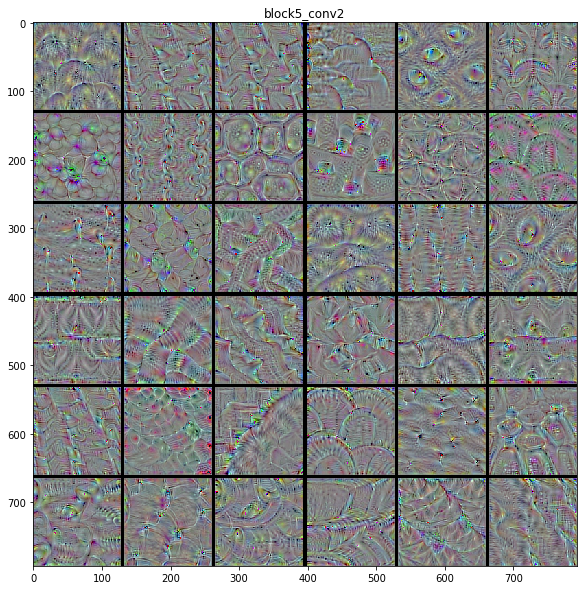

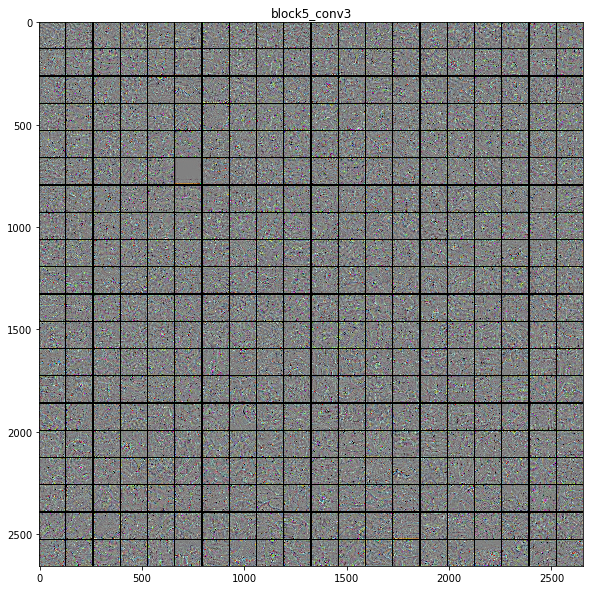

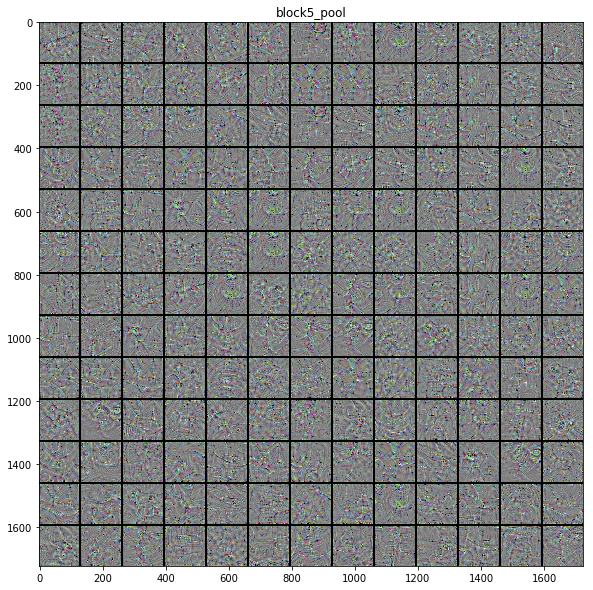

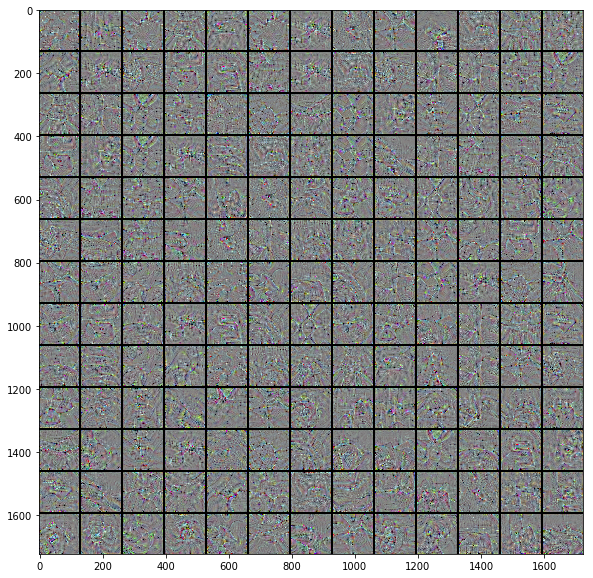

In [29]:
 %matplotlib inline

import matplotlib.pyplot as plt

for layer in model.layers[1:]:
    layer_name = layer.name
    fname = '../cache/'+layer_name+'.npy'
    print(layer_name)
    if os.path.isfile(fname):
        
        kept_filters = list(np.load(fname))
        
        # we will stich the best 64 filters on a 8 x 8 grid.
        n = int(np.sqrt(len(kept_filters)))
        print(len(kept_filters), n)
        # the filters that have the highest loss are assumed to be better-looking.
        # we will only keep the top 64 filters.
        kept_filters.sort(key=lambda x: x[1], reverse=True)
        kept_filters = kept_filters[:n * n]

        # build a black picture with enough space for
        # our 8 x 8 filters of size 128 x 128, with a 5px margin in between
        margin = 5
        width = n * img_width + (n - 1) * margin
        height = n * img_height + (n - 1) * margin
        stitched_filters = np.zeros((width, height, 3))
        
        # fill the picture with our saved filters
        for i in range(n):
            for j in range(n):
        #         print(i*n+j)
                img, loss = kept_filters[i * n + j]
                width_margin = (img_width + margin) * i
                height_margin = (img_height + margin) * j
                stitched_filters[
                    width_margin: width_margin + img_width,
                    height_margin: height_margin + img_height, :] = img
                
        plt.title(layer_name)
        plt.figure(figsize=(20,10))
        plt.imshow(stitched_filters)